# Import Packages

In [1]:
pip install watermark

Note: you may need to restart the kernel to use updated packages.


In [2]:
# 将绘图的图形格式设置为高分辨率，以获得更好的显示质量
%config InlineBackend.figure_format = "retina"
# 加载水印扩展，使 %watermark magic 命令能够显示计算环境的信息
%load_ext watermark
# 用于打印系统信息和软件包版本
%watermark

Last updated: 2023-07-29T19:09:36.217492+01:00

Python implementation: CPython
Python version       : 3.11.4
IPython version      : 8.14.0

Compiler    : GCC 12.2.0
OS          : Linux
Release     : 5.10.16.3-microsoft-standard-WSL2
Machine     : x86_64
Processor   : x86_64
CPU cores   : 20
Architecture: 64bit



In [3]:
# Python中科学计算的基础软件包，提供了对多维数组和矩阵的高效数值运算支持
import numpy as np
# 提供了高效处理结构化数据的数据结构和函数
import pandas as pd
import seaborn as sns
# 处理地理空间数据的python库，允许读取、写入、操作和分析地理空间数据
import geopandas as gpd

# 用于线性规划和优化的Python库。用于解决与位置分析相关的优化问题
import pulp
# 用于几何操作的Python库，用于空间操作和计算
import shapely
# 用于解决空间优化问题的Python库。它提供了解决位置分配问题的各种算法和方法
import spopt
# 是spopt库中的一个模块，包含不同位置分配算法的实现，包括LSCP（位置集覆盖问题）、LSCPB（位置集覆盖问题Benders）和MCLP（最大覆盖位置问题）
from spopt.locate import PMedian, simulated_geo_points
from spopt.locate import MCLP, simulated_geo_points 
# 是 spopt.locate 中的一个函数，用于生成模拟地理点
from shapely.geometry import Point

# 为地理空间可视化中的上下文背景制图提供了对基于网络的地图瓦片服务的轻松访问
import contextily as ctx

# python中广泛使用的绘图库，用于创建各种图
import matplotlib.pyplot as plt
# matplotlib库中的一个模块，提供各种形状和补丁
from matplotlib.patches import Patch
# 为自定义绘图提供了不同类型的线条和标记
import matplotlib.lines as mlines

# -w选项显示代码执行时间，-iv选项显示导入的软件包版本
%watermark -w
%watermark -iv

/tmp/ipykernel_508/338529319.py:7: DeprecationWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas still uses PyGEOS by default. However, starting with version 0.14, the default will switch to Shapely. To force to use Shapely 2.0 now, you can either uninstall PyGEOS or set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In the next release, GeoPandas will switch to using Shapely by default, even if PyGEOS is installed. If you only have PyGEOS installed to get speed-ups, this switch should be smooth. However, if you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd
/home/zhang/miniconda3/envs/sds2023/li

Watermark: 2.4.2

sys       : 3.11.4 | packaged by conda-forge | (main, Jun 10 2023, 18:08:17) [GCC 12.2.0]
spopt     : 0.5.1.dev41+gcac04eb
pulp      : 2.7.0
pandas    : 2.0.3
seaborn   : 0.12.2
matplotlib: 3.7.1
shapely   : 2.0.1
json      : 2.0.9
geopandas : 0.13.2
numpy     : 1.23.5
contextily: 1.3.0



In [4]:
import os

# Set the environment variable to force GeoPandas to use Shapely
os.environ['USE_PYGEOS'] = '0'

import geopandas as gpd

In [5]:
import gurobipy as gp
from gurobipy import GRB

connection_params = {
    "WLSACCESSID": "efeb461e-4fdd-4d61-942a-a22a93513818",
    "WLSSECRET": "a53d35f0-7262-4480-9c2f-cd545b9c2afb",
    "LICENSEID": 2382885,
    "WLSTokenDuration": 20, # 20 minutes token duration
}

with gp.Env(params=connection_params) as env:
    with gp.Model("my_model", env=env) as m:
    
        # Create variables
        x = m.addVar(vtype=GRB.BINARY, name="x")
        y = m.addVar(vtype=GRB.BINARY, name="y")
        z = m.addVar(vtype=GRB.BINARY, name="z")

        # Set objective
        m.setObjective(x + y + 2 * z, GRB.MAXIMIZE)

        # Add constraint: x + 2 y + 3 z <= 4
        m.addConstr(x + 2 * y + 3 * z <= 4, "c0")

        # Add constraint: x + y >= 1
        m.addConstr(x + y >= 1, "c1")

        # Optimize model
        m.optimize()

        for v in m.getVars():
            print('%s %g' % (v.VarName, v.X))

        print('Obj: %g' % m.ObjVal)

Set parameter WLSAccessID
Set parameter WLSSecret
Set parameter LicenseID to value 2382885
Set parameter WLSTokenDuration to value 20
Academic license - for non-commercial use only - registered to ucfnsz3@ucl.ac.uk
Gurobi Optimizer version 10.0.2 build v10.0.2rc0 (linux64)

CPU model: 12th Gen Intel(R) Core(TM) i7-12700H, instruction set [SSE2|AVX|AVX2]
Thread count: 10 physical cores, 20 logical processors, using up to 20 threads

Academic license - for non-commercial use only - registered to ucfnsz3@ucl.ac.uk
Optimize a model with 2 rows, 3 columns and 5 nonzeros
Model fingerprint: 0x98886187
Variable types: 0 continuous, 3 integer (3 binary)
Coefficient statistics:
  Matrix range     [1e+00, 3e+00]
  Objective range  [1e+00, 2e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 4e+00]
Found heuristic solution: objective 2.0000000
Presolve removed 2 rows and 3 columns
Presolve time: 0.01s
Presolve: All rows and columns removed

Explored 0 nodes (0 simplex iterations) in

# 1. Import Data

In [13]:
# load london fire brigade incident records dataset
incident = pd.read_csv('https://raw.githubusercontent.com/ucfnsz3/Dissertation/main/LFB%20Incident%20data_202304.csv.csv')
# load potential base stations dataset
potential_station = pd.read_csv('https://raw.githubusercontent.com/ucfnsz3/Dissertation/main/digimap_final.csv')

In [15]:
# 使用不到的数据列，数据中有很多空值，如果不删除，后面删除空值数据会少很多
incident = incident.drop(['SpecialServiceType'], axis=1)

In [16]:
# 需要经纬度信息，删除空值的点
incident = incident[(incident['Longitude'] != 0) & (incident['Latitude'] != 0)]

In [17]:
# delete the NaN or Null rows for vaccination
incident.dropna(inplace = True)
incident.sample(5)

,IncidentNumber,DateOfCall,CalYear,TimeOfCall,HourOfCall,IncidentGroup,StopCodeDescription,PropertyCategory,PropertyType,AddressQualifier,...,FirstPumpArriving_AttendanceTime,FirstPumpArriving_DeployedFromStation,SecondPumpArriving_AttendanceTime,SecondPumpArriving_DeployedFromStation,NumStationsWithPumpsAttending,NumPumpsAttending,PumpCount,PumpHoursRoundUp,Notional Cost (£),NumCalls
7611,011930-24012023,24 Jan 2023,2023,20:01:17,20,False Alarm,AFA,Other Residential,Student Hall of Residence,Correct incident location,...,326.0,Soho,1012.0,Kentish Town,2.0,2.0,2.0,1.0,364.0,1
8302,013037-26012023,26 Jan 2023,2023,23:19:09,23,Fire,Primary Fire,Non Residential,Church/Chapel,Correct incident location,...,289.0,North Kensington,306.0,North Kensington,1.0,2.0,29.0,99.0,36036.0,32
4364,006830-15012023,15 Jan 2023,2023,16:48:39,16,False Alarm,AFA,Non Residential,Gym,Correct incident location,...,363.0,Dagenham,403.0,Barking,2.0,3.0,3.0,1.0,364.0,1
4232,006603-15012023,15 Jan 2023,2023,02:51:06,2,False Alarm,False alarm - Good intent,Non Residential,Food and drink processing,Within same building,...,381.0,Hayes,434.0,Heathrow,2.0,2.0,2.0,1.0,364.0,1
5634,008832-19012023,19 Jan 2023,2023,12:15:53,12,False Alarm,False alarm - Good intent,Other Residential,Boarding House/B&B for homeless/asylum seekers,Within same building,...,187.0,Kensington,250.0,Paddington,2.0,2.0,2.0,1.0,364.0,1


In [18]:
# 仅仅保留选择的警察局和消防局
potential_station = potential_station[potential_station['classname'] != 'Hospitals']

In [19]:
# check the shape
# 最后得到数据，需要分析1039个需求点和177个设施点
print(incident.shape)
print(potential_station.shape)

(1039, 38)
(177, 34)


# 2. Load Base Map

In [20]:
# set the filepath and load in a shapefile
fp = "London_Borough/London_Borough_Excluding_MHW.shp"

map_df = gpd.read_file(fp)

# check data type so we can see that this is not a normal dataframe, but a GEOdataframe
map_df.head()

,NAME,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry
0,Kingston upon Thames,E09000021,3726.117,0.000,F,NaN,NaN,"POLYGON ((516401.600 160201.800, 516407.300 16..."
1,Croydon,E09000008,8649.441,0.000,F,NaN,NaN,"POLYGON ((535009.200 159504.700, 535005.500 15..."
2,Bromley,E09000006,15013.487,0.000,F,NaN,NaN,"POLYGON ((540373.600 157530.400, 540361.200 15..."
3,Hounslow,E09000018,5658.541,60.755,F,NaN,NaN,"POLYGON ((521975.800 178100.000, 521967.700 17..."
4,Ealing,E09000009,5554.428,0.000,F,NaN,NaN,"POLYGON ((510253.500 182881.600, 510249.900 18..."


In [21]:
# Check the coordinate reference system (CRS) of the GeoDataFrame
crs = map_df.crs

# Print the CRS information
print("Coordinate Reference System (CRS):")
print(crs)

Coordinate Reference System (CRS):
PROJCS["OSGB36 / British National Grid",GEOGCS["OSGB36",DATUM["Ordnance_Survey_of_Great_Britain_1936",SPHEROID["Airy 1830",6377563.396,299.3249646,AUTHORITY["EPSG","7001"]],AUTHORITY["EPSG","6277"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",49],PARAMETER["central_meridian",-2],PARAMETER["scale_factor",0.999601272],PARAMETER["false_easting",400000],PARAMETER["false_northing",-100000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]


In [22]:
# Convert the NAME column to uppercase
map_df.NAME = map_df.NAME.str.upper()

In [23]:
# Calculate the area for each feature using the area attribute
map_df['area'] = map_df.geometry.area

In [24]:
# Load the LFB incident data and filter for the desired year and columns
df_1 = incident[incident['CalYear'] == 2023][['IncidentNumber', 'IncGeo_BoroughName']]
df_1

,IncidentNumber,IncGeo_BoroughName
0,000001-01012023,EALING
7,000013-01012023,LAMBETH
11,000018-01012023,ENFIELD
12,000021-01012023,CROYDON
13,000024-01012023,HAMMERSMITH AND FULHAM
...,...,...
9857,015571-31012023,WESTMINSTER
9861,015583-31012023,LEWISHAM
9862,015586-31012023,WANDSWORTH
9863,015587-31012023,WESTMINSTER


In [25]:
# Group by 'IncGeo_BoroughName' and count the incidents for each borough
df_2 = df_1.groupby('IncGeo_BoroughName', as_index=False)['IncidentNumber'].count()
# Sort the DataFrame in descending order based on the 'IncidentNumber' column
df_2 = df_2.sort_values(by='IncidentNumber', ascending=False)
# Display the modified DataFrame
df_2

,IncGeo_BoroughName,IncidentNumber
32,WESTMINSTER,85
7,CROYDON,59
5,CAMDEN,51
21,LAMBETH,50
16,HILLINGDON,49
27,SOUTHWARK,41
18,ISLINGTON,40
30,WALTHAM FOREST,37
29,TOWER HAMLETS,36
3,BRENT,34


In [26]:
# Merge the incident count data with the map data
merged = map_df.set_index('NAME').join(df_2.set_index('IncGeo_BoroughName'))

# Convert area from square meters to square kilometers
merged['area_km2'] = merged['area'] / 1000000  # Divide by 1,000,000 to convert from square meters to square kilometers

# Calculate the callouts per unit area  (in Square Kilometers)
# merged['callouts_per_area'] = merged['IncidentNumber'] / merged['area']
# Calculate the callouts per unit area in square kilometers
merged['callouts_per_area'] = merged['IncidentNumber'] / merged['area_km2']

# Sort the DataFrame based on the 'callouts_per_area' column in descending order
# ascending=False：以降序排列
sorted_merged = merged.sort_values(by='callouts_per_area', ascending=False)

# Display the specific columns in the sorted DataFrame
columns_to_display = ['GSS_CODE', 'callouts_per_area']

sorted_merged[columns_to_display]

,GSS_CODE,callouts_per_area
NAME,,
CITY OF LONDON,E09000001,6.198506
WESTMINSTER,E09000033,3.955885
ISLINGTON,E09000019,2.692397
CAMDEN,E09000007,2.340599
HAMMERSMITH AND FULHAM,E09000013,2.073472
LAMBETH,E09000022,1.864973
TOWER HAMLETS,E09000030,1.820210
KENSINGTON AND CHELSEA,E09000020,1.732123
SOUTHWARK,E09000028,1.420551


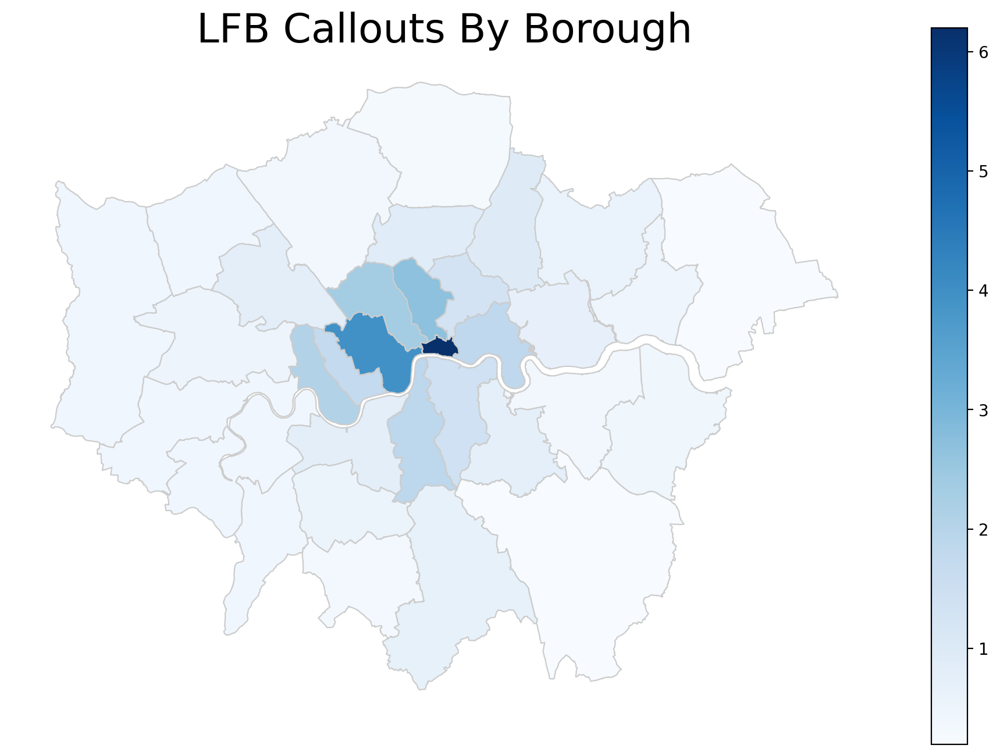

In [27]:
# 创建地图，表示伦敦每个行政区单位面积内的呼叫次数（callouts_per_area）

# set variables
variable = 'callouts_per_area'

# set the range for the choropleth
vmin, vmax = merged[variable].min(), merged[variable].max()

# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(12, 8))

# create map
merged.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')

# Now we can customise and add annotations

# remove the axis
ax.axis('off')

# add a title
ax.set_title('LFB Callouts By Borough', \
              fontdict={'fontsize': '25',
                        'fontweight' : '3'})

# create an annotation for the  data source
#ax.annotate('Source: London Datastore, 2023',
           #xy=(0.1, .08), xycoords='figure fraction',
           #horizontalalignment='left', verticalalignment='top',
           #fontsize=10, color='#555555')

# Create colorbar as a legend
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbar = fig.colorbar(sm, ax=ax)  # Explicitly provide 'ax' parameter to avoid the warning

# this will save the figure as a high-res png. you can also save as svg
#fig.savefig('London_Borough/images/calloutsmap.png', dpi=300)

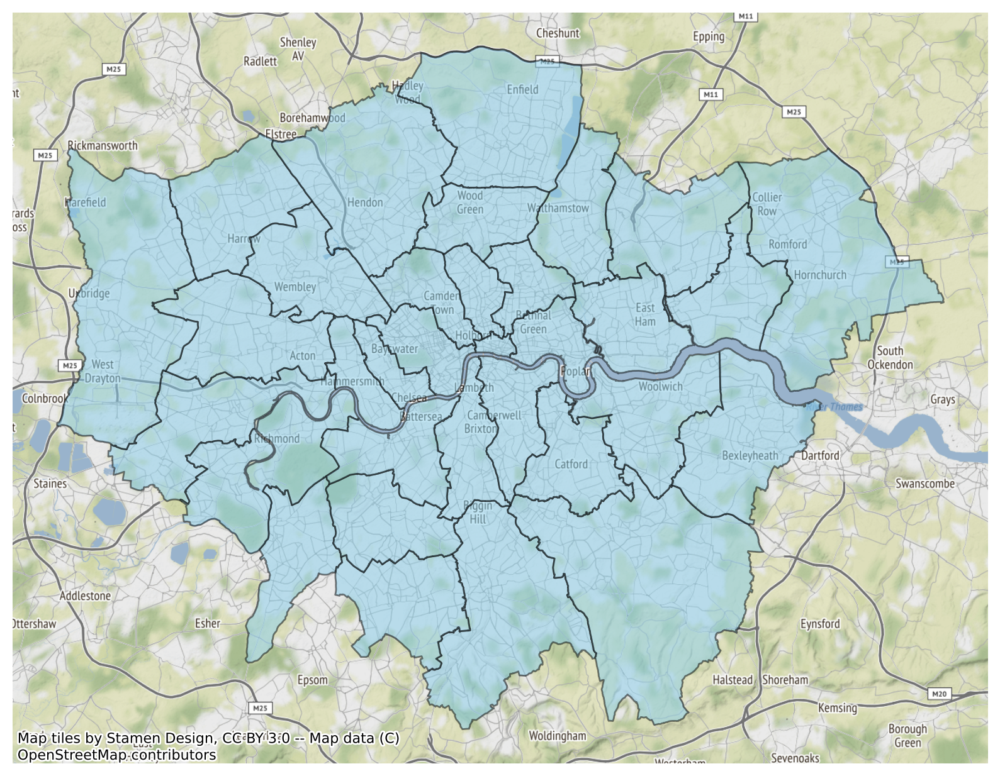

In [28]:
# Convert the merged dataframe to the desired CRS
# OpenStreetMap，默认使用网络墨卡托投影（EPSG:3857）
background = merged.to_crs(epsg=3857)

# alpha controls the transparency of the polygons (0.5 means semi-transparent), 
# edgecolor sets the color of the boundary lines of the polygons, 
# and color sets the fill color of the polygons
ax = background.plot(figsize=(10, 10), alpha=0.5, edgecolor='k', color='skyblue')

# Add a basemap using contextily to provide additional map context
ctx.add_basemap(ax)

# Remove the x and y axis tick labels
ax.set_xticks([])
ax.set_yticks([])

# Remove the surrounding black border line
ax.axis('off')

plt.show()

# 3. Descriptive Statistics

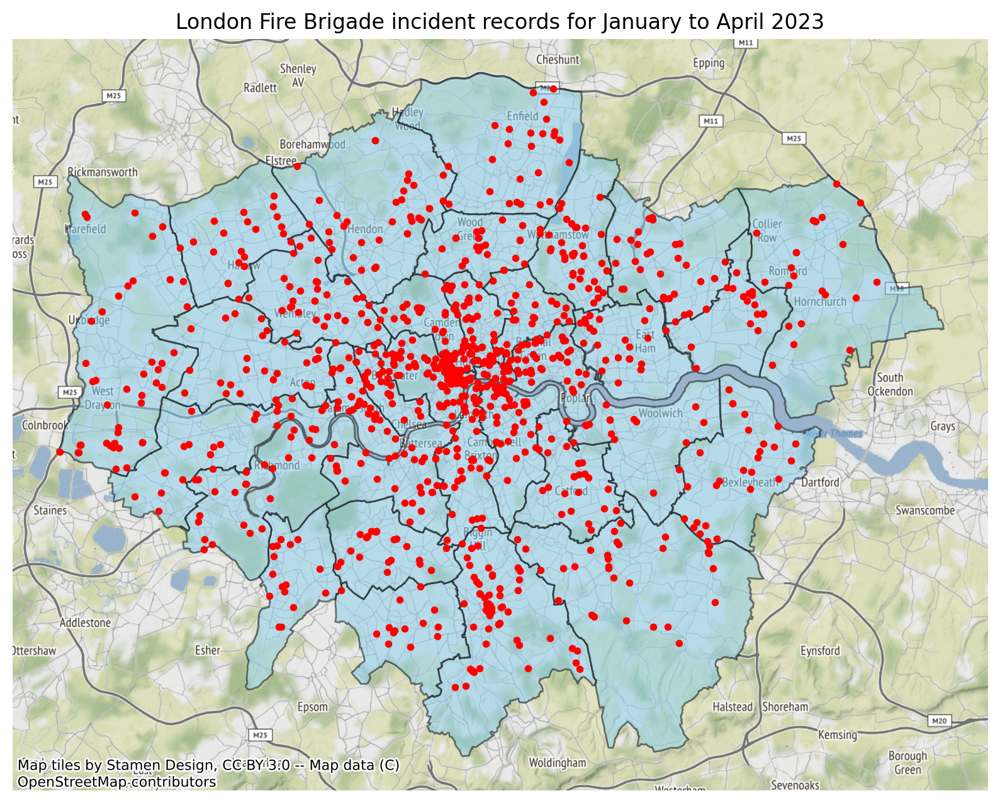

In [22]:
# Create a GeoDataFrame from Staion_LSOA using longitude and latitude columns
geometry = gpd.points_from_xy(incident['Longitude'], incident['Latitude'])
incident = gpd.GeoDataFrame(incident, geometry=geometry)

# Set CRS for Staion_LSOA GeoDataFrame
incident.crs = 'EPSG:4326'

# Reproject Staion_LSOA to match the basemap CRS
incident = incident.to_crs(background.crs)

# Create matplotlib axes and plot basemap
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the background map
background.plot(ax=ax, alpha=0.5, edgecolor='k', color='skyblue')
ctx.add_basemap(ax)

# Plot the base station points as solid yellow origin points
incident.plot(ax=ax, color='red', marker='o', markersize=10)

# Remove the x and y axis labels
ax.set_xticks([])
ax.set_yticks([])

# Remove the surrounding black border line
ax.axis('off')

ax.set_title('London Fire Brigade incident records for January to April 2023')

# Show the map plot
plt.show()

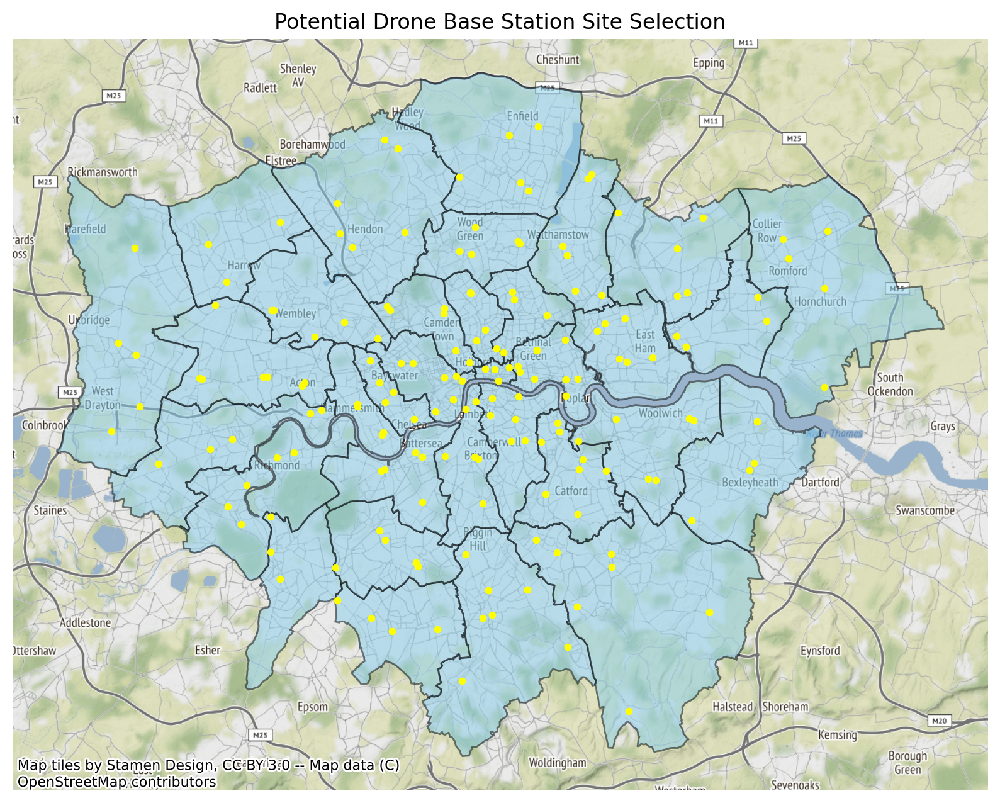

In [23]:
# Create a GeoDataFrame from Staion_LSOA using longitude and latitude columns
geometry_2 = gpd.points_from_xy(potential_station['Longitude'], potential_station['Latitude'])
potential_station = gpd.GeoDataFrame(potential_station, geometry=geometry_2)

# Set CRS for Staion_LSOA GeoDataFrame
potential_station.crs = 'EPSG:4326'

# Reproject Staion_LSOA to match the basemap CRS
potential_station = potential_station.to_crs(background.crs)

# Create matplotlib axes and plot basemap
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the background map
background.plot(ax=ax, alpha=0.5, edgecolor='k', color='skyblue')
ctx.add_basemap(ax)

# Plot the base station points as solid yellow origin points
potential_station.plot(ax=ax, color='yellow', marker='o', markersize=10)

# Remove the x and y axis labels
ax.set_xticks([])
ax.set_yticks([])

# Remove the surrounding black border line
ax.axis('off')

ax.set_title('Potential Drone Base Station Site Selection')

# Show the map plot
plt.show()

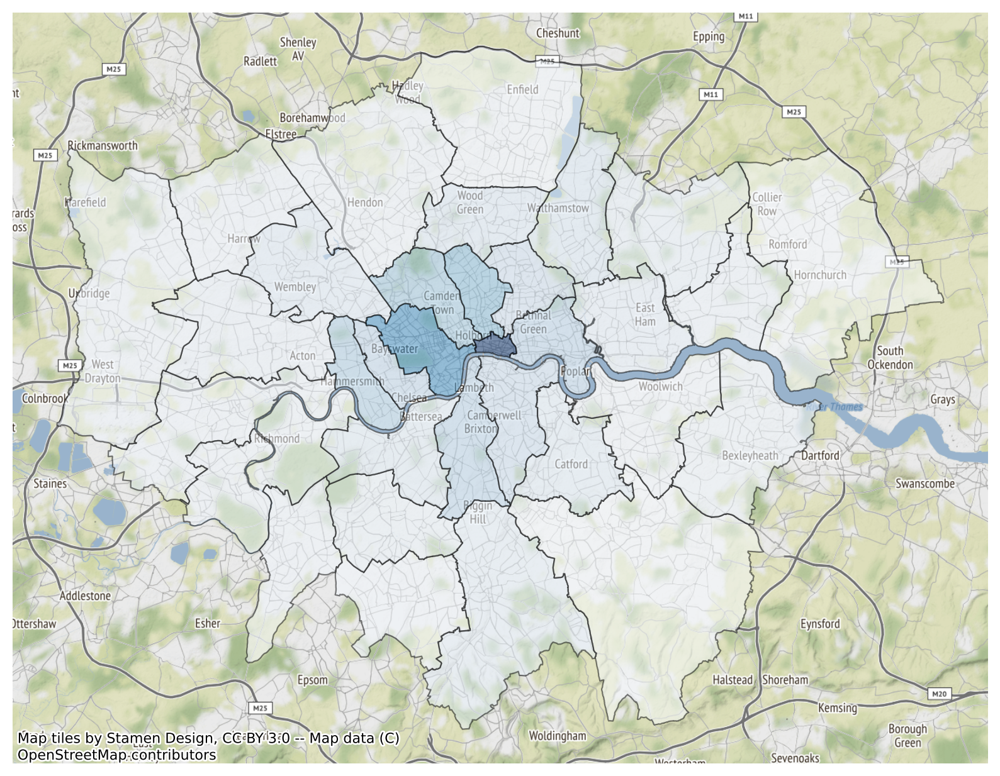

In [24]:
ax = background.plot(figsize=(10, 10), alpha=0.5, column=variable, cmap='Blues', linewidth=0.8, edgecolor='k')
ctx.add_basemap(ax)

# Remove the x and y axis labels
ax.set_xticks([])
ax.set_yticks([])

# Remove the surrounding black border line
ax.axis('off')

plt.show()

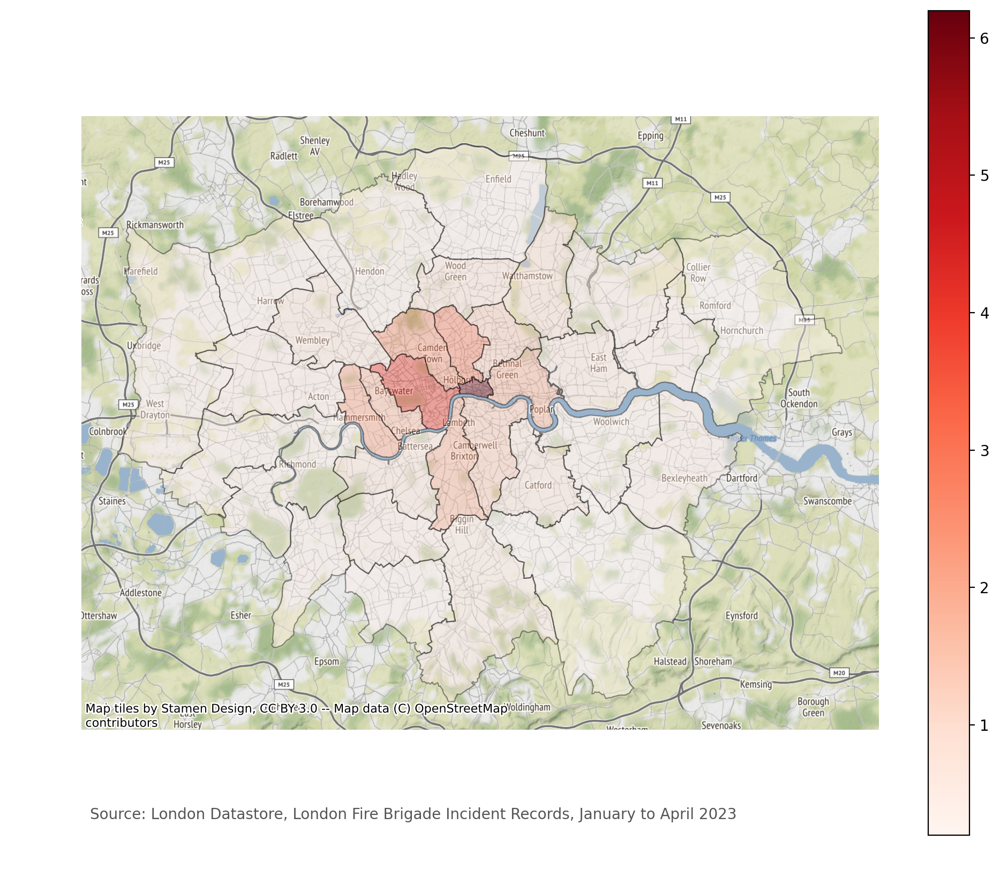

In [25]:
variable = 'callouts_per_area'

# set the range for the choropleth
vmin, vmax = merged[variable].min(), merged[variable].max()

# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(12, 10))

# create map
background.plot(column=variable, alpha = 0.4, cmap='Reds', ax=ax,linewidth=0.8, edgecolor='k')
ctx.add_basemap(ax)

# Now we can customise and add annotations

# remove the axis
ax.axis('off')

# add a title
#ax.set_title('LFB 2022 Callouts by Borough', \
             # fontdict={'fontsize': '25',
                        #'fontweight' : '3'})

# create an annotation for the  data source
ax.annotate('Source: London Datastore, London Fire Brigade Incident Records, January to April 2023',
           xy=(0.07, .08), xycoords='figure fraction',
           horizontalalignment='left', verticalalignment='top',
           fontsize=10, color='#555555')

# Create colorbar as a legend
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbar = fig.colorbar(sm, ax=ax)

# this will save the figure as a high-res png. you can also save as svg
#fig.savefig('Assets/images/calloutsmap1.png', dpi=300)

In [113]:
filtered_1 = incident[incident['IncidentGroup'].isin(['False Alarm', 'Fire'])]
filtered_1 = filtered_1["IncidentGroup"].value_counts() / filtered_1.shape[0]
filtered_1 = pd.DataFrame(filtered_1).reset_index().rename(columns={"index": "Emergency", "Emergency": "Percentage"})
filtered_1.head()

,IncidentGroup,count
0,False Alarm,0.803001
1,Fire,0.196999


Text(0.5, 0, 'Emergency Status')

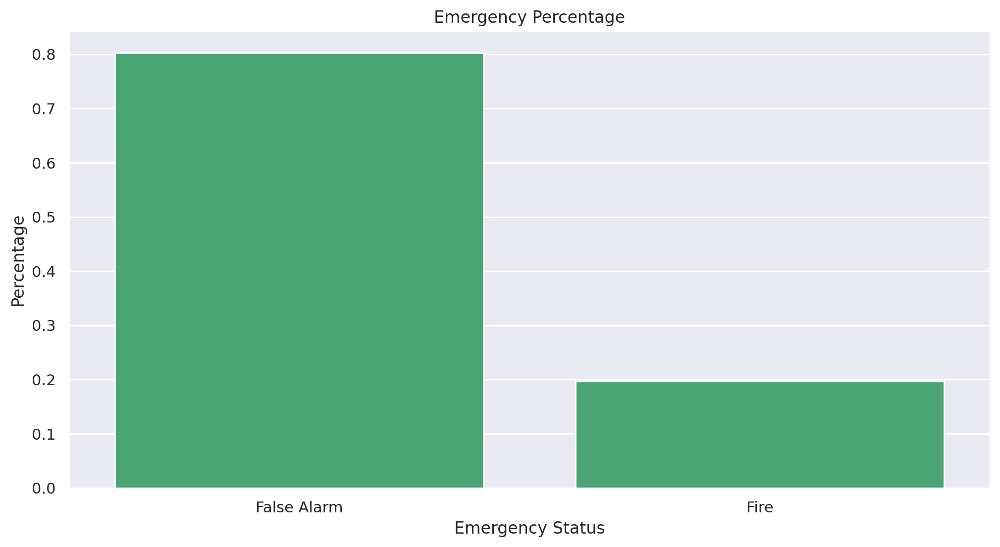

In [114]:
#Make a bar chart of the results
sns.set(rc = {'figure.figsize':(12, 6)})
sns.barplot(x="IncidentGroup", y = "count", order = filtered_1["IncidentGroup"] \
                                            , data = filtered_1, color = "mediumseagreen")
plt.title("Emergency Percentage")
plt.ylabel("Percentage")
plt.xlabel("Emergency Status")

In [115]:
mth_by_emergency = incident["Month"].value_counts().sort_index()
percentage = mth_by_emergency / incident.shape[0]

mth_by_emergency = pd.DataFrame({"Month": mth_by_emergency.index, "Count": mth_by_emergency.values, "Percentage": percentage.values})
mth_by_emergency["Percentage"] = mth_by_emergency["Percentage"].round(4)  # Round the percentage to 4 decimal places
mth_by_emergency["Percentage"] = mth_by_emergency["Percentage"] / mth_by_emergency["Percentage"].sum()  # Normalize the percentage column
mth_by_emergency = mth_by_emergency.sort_values("Month", key=lambda x: pd.to_datetime(x, format="%B"))
mth_by_emergency

,Month,Count,Percentage
2,January,9931,0.2635
1,February,8913,0.2365
3,March,9601,0.2547
0,April,9243,0.2453


Text(0.5, 0, 'Percentage')

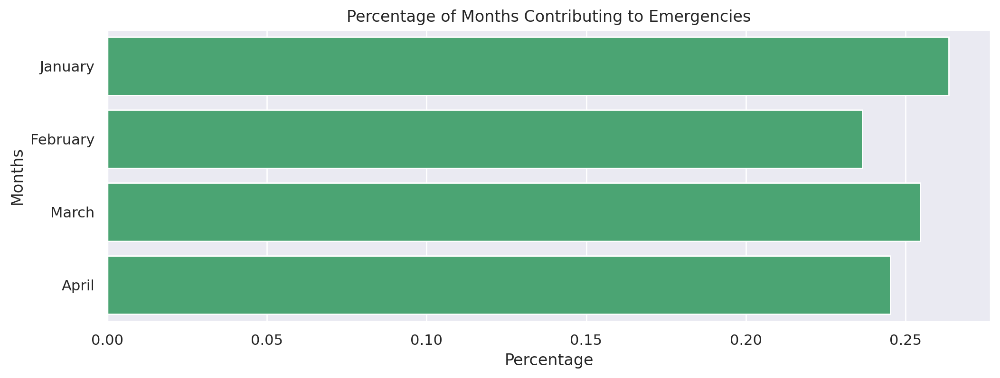

In [116]:
#Make a bar chart of the results
sns.set(rc = {'figure.figsize':(12,4)})
sns.barplot(x="Percentage", y = "Month", order = mth_by_emergency["Month"] \
                                            , data = mth_by_emergency, color = "mediumseagreen")
plt.title("Percentage of Months Contributing to Emergencies")
plt.ylabel("Months")
plt.xlabel("Percentage")

In [103]:
hr_grp = incident["HourOfCall"].value_counts().sort_index()
percentage = hr_grp / incident.shape[0]

hr_grp = pd.DataFrame({"HourOfCall": hr_grp.index, "Count": hr_grp.values, "Percentage": percentage.values})
hr_grp["Percentage"] = hr_grp["Percentage"].round(4)  # Round the percentage to 4 decimal places
hr_grp["Percentage"] = hr_grp["Percentage"] / hr_grp["Percentage"].sum()  # Normalize the percentage column
hr_grp = hr_grp.astype({"HourOfCall": int})  # Convert the "HourOfCall" column to integer type
hr_grp = hr_grp.sort_values("HourOfCall")
hr_grp

,HourOfCall,Count,Percentage
0,0,1269,0.0337
1,1,1041,0.0276
2,2,882,0.0234
3,3,782,0.0207
4,4,729,0.0193
5,5,612,0.0162
6,6,639,0.0170
7,7,1008,0.0267
8,8,1347,0.0357
9,9,1604,0.0426


/tmp/ipykernel_184/1531750558.py:2: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  hr_grp["HourOfCall"] = hr_grp["HourOfCall"].astype(np.str)


Text(0.5, 0, 'Hour')

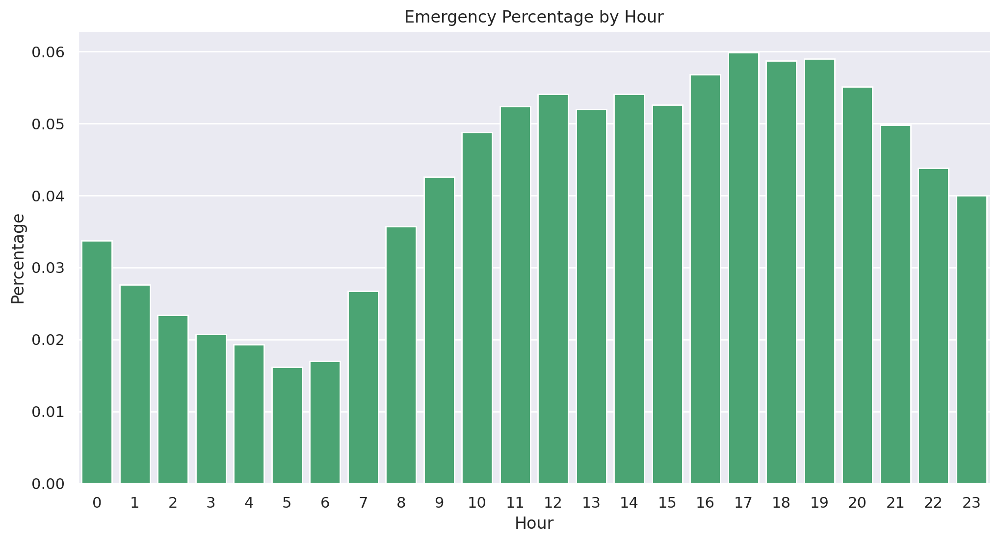

In [107]:
#Make a bar chart of the results
hr_grp["HourOfCall"] = hr_grp["HourOfCall"].astype(np.str)
sns.set(rc = {'figure.figsize':(12,6)})
sns.barplot(x="HourOfCall", y = "Percentage", order = hr_grp["HourOfCall"] \
                                            , data = hr_grp, color = "mediumseagreen")
plt.title("Emergency Percentage by Hour")
plt.ylabel("Percentage")
plt.xlabel("Hour")

In [101]:
pc_by_emergency = incident["PropertyCategory"].value_counts().sort_index()
percentage = pc_by_emergency / incident.shape[0]

pc_by_emergency = pd.DataFrame({"PropertyCategory": pc_by_emergency.index, "Count": pc_by_emergency.values, "Percentage": percentage.values})
pc_by_emergency["Percentage"] = pc_by_emergency["Percentage"].round(4)  # Round the percentage to 4 decimal places
pc_by_emergency["Percentage"] = pc_by_emergency["Percentage"] / pc_by_emergency["Percentage"].sum()  # Normalize the percentage column
pc_by_emergency = pc_by_emergency.astype({"PropertyCategory": "category"})  # Convert the "PropertyCategory" column to categorical type
pc_by_emergency = pc_by_emergency.sort_values("PropertyCategory")
pc_by_emergency

,PropertyCategory,Count,Percentage
0,Aircraft,33,0.0009
1,Boat,29,0.0008
2,Dwelling,22059,0.5853
3,Non Residential,8032,0.2131
4,Other Residential,1929,0.0512
5,Outdoor,1987,0.0527
6,Outdoor Structure,1393,0.0370
7,Rail Vehicle,35,0.0009
8,Road Vehicle,2191,0.0581


Text(0.5, 0, 'Percentage')

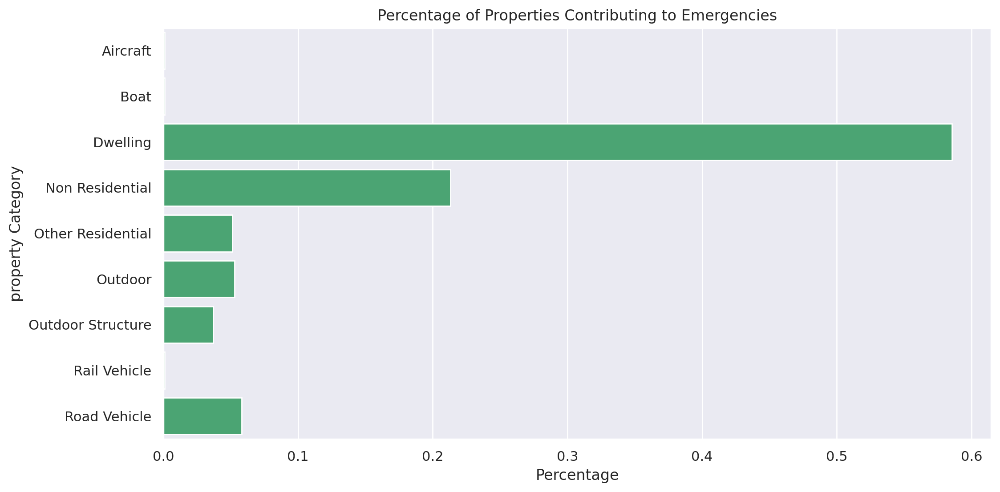

In [108]:
#Make a bar chart of the results
sns.set(rc = {'figure.figsize':(12,6)})
sns.barplot(x="Percentage", y = "PropertyCategory", order = pc_by_emergency["PropertyCategory"] \
                                            , data = pc_by_emergency, color = "mediumseagreen")
plt.title("Percentage of Properties Contributing to Emergencies")
plt.ylabel("property Category")
plt.xlabel("Percentage")

In [171]:
incident["FirstPumpArriving_AttendanceTime"].describe()

count    35644.000000
mean       311.250926
std        129.034830
min          1.000000
25%        230.000000
50%        294.000000
75%        372.000000
max       1194.000000
Name: FirstPumpArriving_AttendanceTime, dtype: float64

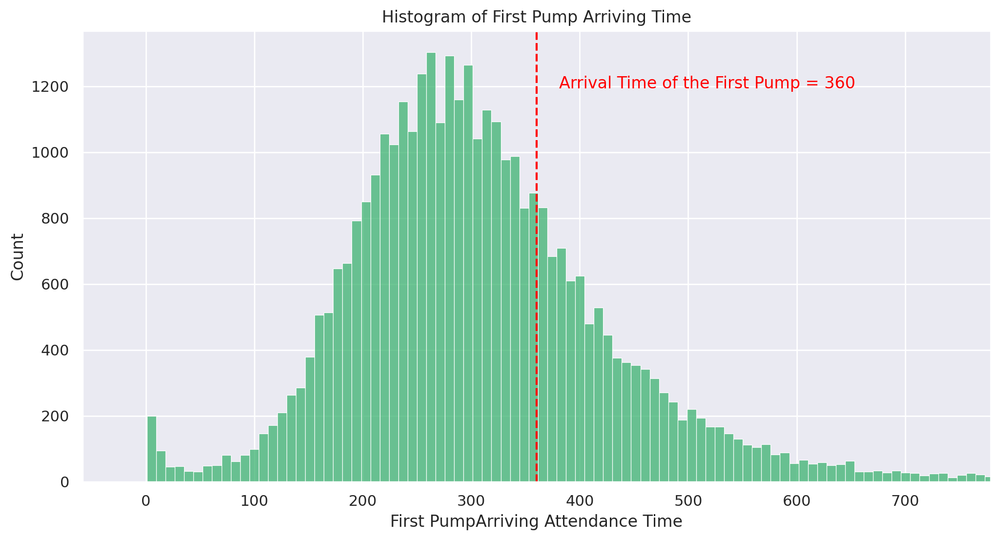

In [44]:
# Assuming you have the LFBIncidentdata loaded as a DataFrame

# Set the figure size
sns.set(rc={'figure.figsize': (12, 6)})

# Create the histogram using seaborn
histplot = sns.histplot(x="FirstPumpArriving_AttendanceTime", data=incident, color="mediumseagreen")

# Add a line at x=360 in the middle of the x-axis range
plt.axvline(x=360, color='red', linestyle='--')

# Get the x-axis limits
x_limits = histplot.get_xlim()

# Set the new x-axis limits to include the line at x=360
new_x_limits = (x_limits[0], x_limits[1])
new_x_limits = (new_x_limits[0], 360 + (360 - new_x_limits[0]))
histplot.set_xlim(new_x_limits)

# Add the value x=360 in red below the x-axis
#plt.text(360, -histplot.get_ylim()[1]*0.03, 'x = 360', color='red', verticalalignment='top', horizontalalignment='center')
# Add the value x=360 in red above the red dotted line
plt.text(360 + (new_x_limits[1] - 360) * 0.05, histplot.get_ylim()[1]*0.9, 'Arrival Time of the First Pump = 360', color='red', verticalalignment='top', horizontalalignment='left')

# Set the title and labels
plt.title("Histogram of First Pump Arriving Time")
plt.xlabel("First PumpArriving Attendance Time")

# Display the plot
plt.show()

In [110]:
# Assuming you have the LFBIncidentdata loaded as a DataFrame
# Calculate the first_pup_arriving_min column using the 'FirstPumpArriving_AttendanceTime' column
incident['first_pup_arriving_min'] = incident['FirstPumpArriving_AttendanceTime'].apply(lambda x: x/60)
# Alternatively, you can also use the div operation to divide the column by 60
incident['first_pup_arriving_min'] = incident['FirstPumpArriving_AttendanceTime'] / 60

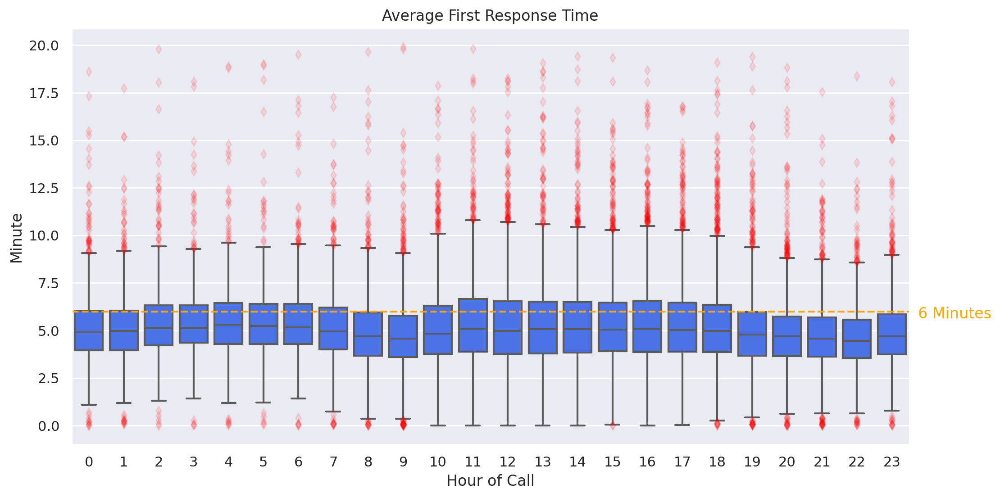

In [111]:
# Assuming you have the LFBIncidentdata loaded as a DataFrame

# Create the boxplot using seaborn
sns.boxplot(data=incident, x='HourOfCall', y='first_pup_arriving_min',
            color="#3366FF", flierprops={'markerfacecolor': 'red', 'markeredgecolor': 'red', 'alpha': 0.1})

# Add a line at y=6
plt.axhline(y=6, color='orange', linestyle='--')

# Set the title and labels
plt.title("Average First Response Time")
plt.xlabel("Hour of Call")
plt.ylabel("Minute")

# Get the x and y limits of the plot
x_limits = plt.xlim()
y_limits = plt.ylim()

# Add the value 6.0 in red below and to the left of the top right corner of the plot
plt.text(x_limits[1] * 1.1, y_limits[1] * 0.3, '6 Minutes', color='orange', verticalalignment='top', horizontalalignment='right')

# Display the plot
plt.show()